# Face Generation
In this project, I use generative adversarial networks to generate new images of faces.
### Get the Data
I be using two datasets in this project:
- MNIST
- CelebA

Will run on MNIST before CelebA.

If using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'

import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
The [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

/home/carnd/anaconda3/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/carnd/anaconda3/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


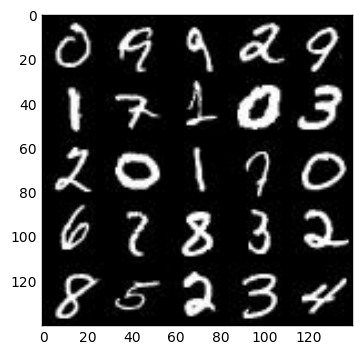

In [2]:
show_n_images = 25

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  I will not need the annotations.  You can view the first number of examples by changing `show_n_images`.

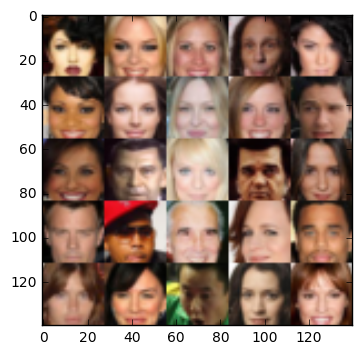

In [3]:
show_n_images = 25

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
The project's main focus is on building the GANs, with the data preprocessed. The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
Build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check the correct version of TensorFlow and access to a GPU.

In [4]:
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    print('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_inputs = tf.placeholder(tf.float32,[None, image_width, image_height, image_channels], name='Real-Input')
    z_inputs = tf.placeholder(tf.float32,[None, z_dim], name='Z-Data')
    learning_rate = tf.placeholder(tf.float32, None, name='Learning-Rate')

    return real_inputs, z_inputs, learning_rate

tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha = 0.1):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        # Layer 1
        layer1 = tf.layers.conv2d(images, 64, 5, strides=2, padding="same")
        layer1 = tf.layers.batch_normalization(layer1, training=True)
        layer1 = tf.maximum(alpha * layer1, layer1)
        # Layer 2
        layer2 = tf.layers.conv2d(layer1, 128, 5, strides=2, padding="same")
        layer2 = tf.layers.batch_normalization(layer2, training=True)
        layer2 = tf.maximum(alpha * layer2, layer2)
        # Layer 3
        layer3 = tf.layers.conv2d(layer2, 256, 5, strides=2, padding="same")
        layer3 = tf.layers.batch_normalization(layer3, training=True)
        layer3 = tf.maximum(alpha * layer3, layer3)
        # Flat
        flat = tf.reshape(layer3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        output = tf.sigmoid(logits)

    return output, logits

tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, dropout_rate = 0.2, alpha = 0.1):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=(not is_train)):
        # Layer 1
        layer1 = tf.layers.dense(z, 4*4*512) 
        layer1 = tf.reshape(layer1, (-1,4,4,512))
        layer1 = tf.layers.batch_normalization(layer1, training=is_train)
        layer1 = tf.maximum(alpha * layer1, layer1)
        # Layer 2
        layer2 = tf.layers.conv2d_transpose(layer1, 256, 4, strides=1, padding="valid")
        layer2 = tf.layers.batch_normalization(layer2,training=is_train)
        layer2 = tf.maximum(alpha * layer2, layer2)
        # Layer 3
        layer3 = tf.layers.conv2d_transpose(layer2, 128, 4, strides=2, padding="same")
        layer3 = tf.layers.batch_normalization(layer3, training=is_train)
        layer3 = tf.maximum(alpha * layer3, layer3)
        # Flat
        flat = tf.layers.conv2d_transpose(layer3, out_channel_dim, 4, strides=2, padding="same")
        logits = flat
        output = tf.tanh(logits)
       
    return output

tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    smoothing_value = 0.9 # per slack channel
    
    _, discriminator_real_logits = discriminator(input_real, reuse=False)
    g_fake = generator(input_z, out_channel_dim, is_train=True)
   
    discriminator_fake_logits = discriminator(g_fake, reuse=True)
    
    discriminator_real_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=discriminator_real_logits, 
                                                              labels=tf.ones_like(discriminator_real_logits) * (smoothing_value)))
    discriminator_fake_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=discriminator_fake_logits, 
                                                              labels=tf.zeros_like(discriminator_fake_logits)))
    discriminator_loss = discriminator_real_loss + discriminator_fake_loss

    generator_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=discriminator_fake_logits,
                                                         labels=tf.ones_like(discriminator_fake_logits)))
    return discriminator_loss, generator_loss

tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    training_vars = tf.trainable_variables()
    generator_vars = [var for var in training_vars if var.name.startswith('generator')]
    discriminator_vars = [var for var in training_vars if var.name.startswith('discriminator')]
    all_update_operations = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    
    discriminator_update = [var for var in all_update_operations if var.name.startswith('discriminator')]
    generator_update = [var for var in all_update_operations if var.name.startswith('generator')]


    with tf.control_dependencies(discriminator_update):
        discriminator_optimizer = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(d_loss, var_list=discriminator_vars)
    with tf.control_dependencies(generator_update):
        generator_optimizer = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss, var_list=generator_vars)
    return discriminator_optimizer, generator_optimizer

tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    print_stats = 50
    show_image = 250
    # create inputs, losses and optimizers
    input_real, input_z, lr = model_inputs(*data_shape[1:4], z_dim)
    discriminator_loss, generator_loss = model_loss(input_real, input_z, data_shape[3])
    discriminator_optimizer, generator_optimizer = model_opt(discriminator_loss, generator_loss, learning_rate, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            counter = 0
            for batch_images in get_batches(batch_size):
                counter += 1
                batch_images = batch_images.reshape(batch_size, *data_shape[1:4])
                batch_images = batch_images*2

                z_batch = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(discriminator_optimizer, feed_dict={input_real: batch_images, input_z: z_batch})
                _ = sess.run(generator_optimizer, feed_dict={input_real: batch_images, input_z: z_batch})
                _ = sess.run(generator_optimizer, feed_dict={input_real: batch_images, input_z: z_batch})
                
                # Print stats
                if counter % show_image == 0:
                    show_generator_output(sess, 32, input_z, data_shape[3], data_image_mode) 
                if counter % print_stats == 0:
                    discriminator_train = discriminator_loss.eval(feed_dict={input_real: batch_images, input_z: z_batch})
                    generator_train = generator_loss.eval(feed_dict={input_z: z_batch})
                    print("Epoch {}/{}...".format(epoch_i + 1, epoch_count),
                          "Step {}...".format(counter),
                          "Discriminator Loss: {:.4f}...".format(discriminator_train),
                          "Generator Loss: {:.4f}".format(generator_train))              

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/4... Step 50... Discriminator Loss: 1.6536... Generator Loss: 0.5015
Epoch 1/4... Step 100... Discriminator Loss: 1.5343... Generator Loss: 0.4777
Epoch 1/4... Step 150... Discriminator Loss: 1.6990... Generator Loss: 0.3186
Epoch 1/4... Step 200... Discriminator Loss: 1.4424... Generator Loss: 0.4865


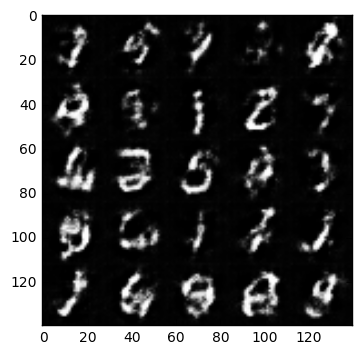

Epoch 1/4... Step 250... Discriminator Loss: 1.3563... Generator Loss: 0.5810
Epoch 1/4... Step 300... Discriminator Loss: 1.5224... Generator Loss: 0.3987
Epoch 1/4... Step 350... Discriminator Loss: 1.4821... Generator Loss: 0.4266
Epoch 1/4... Step 400... Discriminator Loss: 1.4969... Generator Loss: 0.4961
Epoch 1/4... Step 450... Discriminator Loss: 1.5387... Generator Loss: 0.4269


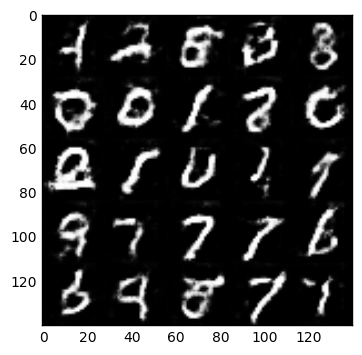

Epoch 1/4... Step 500... Discriminator Loss: 1.5462... Generator Loss: 0.5257
Epoch 1/4... Step 550... Discriminator Loss: 1.6082... Generator Loss: 0.6910
Epoch 1/4... Step 600... Discriminator Loss: 1.4631... Generator Loss: 0.5145
Epoch 1/4... Step 650... Discriminator Loss: 1.5794... Generator Loss: 0.4065
Epoch 1/4... Step 700... Discriminator Loss: 1.4059... Generator Loss: 0.4646


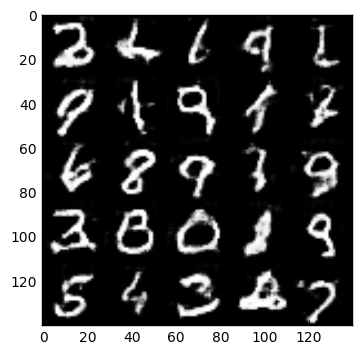

Epoch 1/4... Step 750... Discriminator Loss: 1.4538... Generator Loss: 0.5432
Epoch 1/4... Step 800... Discriminator Loss: 1.5153... Generator Loss: 0.7441
Epoch 1/4... Step 850... Discriminator Loss: 1.8948... Generator Loss: 0.2686
Epoch 1/4... Step 900... Discriminator Loss: 1.5132... Generator Loss: 0.4276
Epoch 2/4... Step 50... Discriminator Loss: 1.4503... Generator Loss: 0.4634
Epoch 2/4... Step 100... Discriminator Loss: 1.5403... Generator Loss: 0.6240
Epoch 2/4... Step 150... Discriminator Loss: 1.6834... Generator Loss: 0.3258
Epoch 2/4... Step 200... Discriminator Loss: 1.4156... Generator Loss: 0.5492


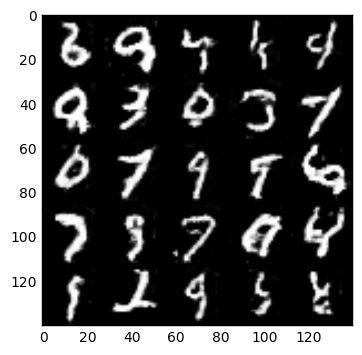

Epoch 2/4... Step 250... Discriminator Loss: 1.5724... Generator Loss: 0.3713
Epoch 2/4... Step 300... Discriminator Loss: 1.3512... Generator Loss: 0.7388
Epoch 2/4... Step 350... Discriminator Loss: 1.5338... Generator Loss: 0.3985
Epoch 2/4... Step 400... Discriminator Loss: 1.4356... Generator Loss: 0.4628
Epoch 2/4... Step 450... Discriminator Loss: 1.2759... Generator Loss: 0.7662


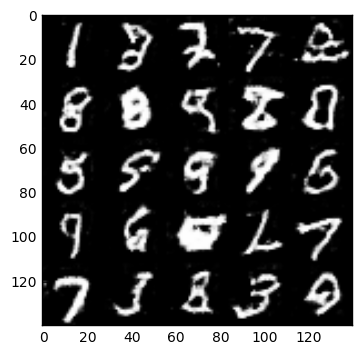

Epoch 2/4... Step 500... Discriminator Loss: 1.4331... Generator Loss: 0.4381
Epoch 2/4... Step 550... Discriminator Loss: 1.7704... Generator Loss: 1.0661
Epoch 2/4... Step 600... Discriminator Loss: 1.6073... Generator Loss: 0.3551
Epoch 2/4... Step 650... Discriminator Loss: 1.8099... Generator Loss: 0.2924
Epoch 2/4... Step 700... Discriminator Loss: 1.3499... Generator Loss: 0.5717


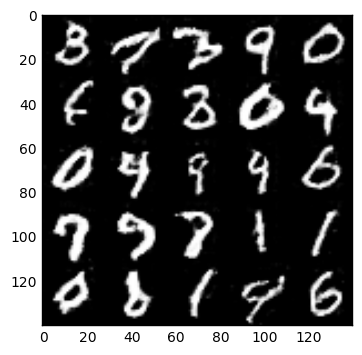

Epoch 2/4... Step 750... Discriminator Loss: 1.3747... Generator Loss: 0.4850
Epoch 2/4... Step 800... Discriminator Loss: 1.4352... Generator Loss: 0.5160
Epoch 2/4... Step 850... Discriminator Loss: 1.8410... Generator Loss: 0.2932
Epoch 2/4... Step 900... Discriminator Loss: 1.2748... Generator Loss: 0.5733
Epoch 3/4... Step 50... Discriminator Loss: 1.8042... Generator Loss: 0.2990
Epoch 3/4... Step 100... Discriminator Loss: 1.2816... Generator Loss: 0.7122
Epoch 3/4... Step 150... Discriminator Loss: 1.5728... Generator Loss: 0.3698
Epoch 3/4... Step 200... Discriminator Loss: 1.6197... Generator Loss: 0.3542


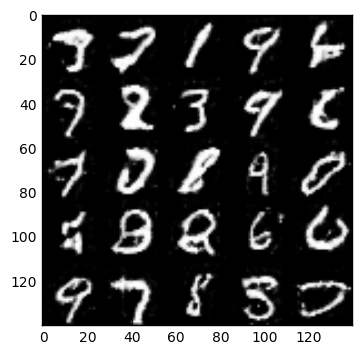

Epoch 3/4... Step 250... Discriminator Loss: 1.4790... Generator Loss: 0.4157
Epoch 3/4... Step 300... Discriminator Loss: 1.4179... Generator Loss: 0.4610
Epoch 3/4... Step 350... Discriminator Loss: 1.5792... Generator Loss: 0.3868
Epoch 3/4... Step 400... Discriminator Loss: 1.3839... Generator Loss: 0.5001
Epoch 3/4... Step 450... Discriminator Loss: 1.4168... Generator Loss: 0.4460


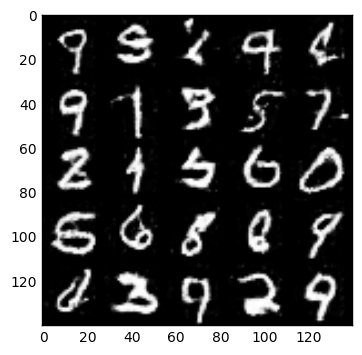

Epoch 3/4... Step 500... Discriminator Loss: 1.5997... Generator Loss: 0.3594
Epoch 3/4... Step 550... Discriminator Loss: 1.4415... Generator Loss: 0.4600
Epoch 3/4... Step 600... Discriminator Loss: 1.5784... Generator Loss: 0.3716
Epoch 3/4... Step 650... Discriminator Loss: 1.4306... Generator Loss: 0.4405
Epoch 3/4... Step 700... Discriminator Loss: 1.3568... Generator Loss: 0.5767


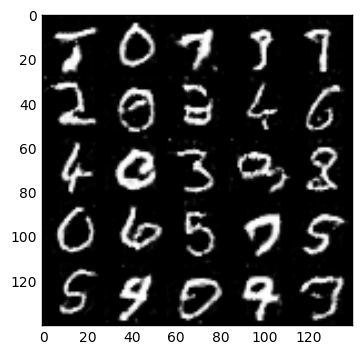

Epoch 3/4... Step 750... Discriminator Loss: 1.3378... Generator Loss: 0.7562
Epoch 3/4... Step 800... Discriminator Loss: 1.4855... Generator Loss: 0.4135
Epoch 3/4... Step 850... Discriminator Loss: 1.7926... Generator Loss: 0.2986
Epoch 3/4... Step 900... Discriminator Loss: 1.4773... Generator Loss: 0.6203
Epoch 4/4... Step 50... Discriminator Loss: 1.8841... Generator Loss: 0.2895
Epoch 4/4... Step 100... Discriminator Loss: 1.2629... Generator Loss: 0.6494
Epoch 4/4... Step 150... Discriminator Loss: 2.9617... Generator Loss: 0.2008
Epoch 4/4... Step 200... Discriminator Loss: 1.4144... Generator Loss: 0.4600


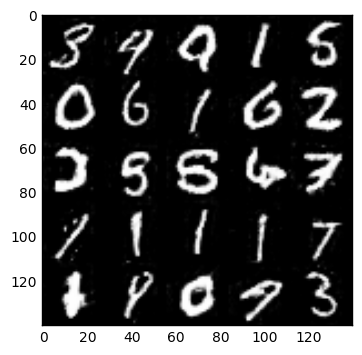

Epoch 4/4... Step 250... Discriminator Loss: 1.5764... Generator Loss: 0.3794
Epoch 4/4... Step 300... Discriminator Loss: 1.5170... Generator Loss: 0.4021
Epoch 4/4... Step 350... Discriminator Loss: 1.4982... Generator Loss: 0.4053
Epoch 4/4... Step 400... Discriminator Loss: 1.4450... Generator Loss: 0.4506
Epoch 4/4... Step 450... Discriminator Loss: 1.3156... Generator Loss: 0.5357


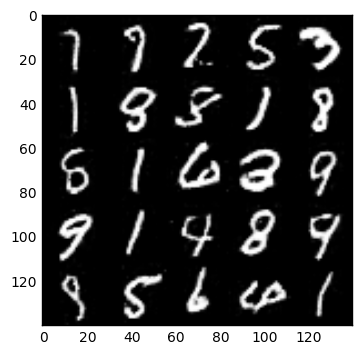

Epoch 4/4... Step 500... Discriminator Loss: 1.4975... Generator Loss: 0.4357
Epoch 4/4... Step 550... Discriminator Loss: 1.6722... Generator Loss: 0.3427
Epoch 4/4... Step 600... Discriminator Loss: 1.8270... Generator Loss: 0.2961
Epoch 4/4... Step 650... Discriminator Loss: 1.7059... Generator Loss: 0.3258
Epoch 4/4... Step 700... Discriminator Loss: 1.4094... Generator Loss: 0.4767


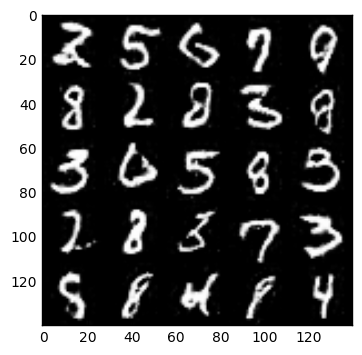

Epoch 4/4... Step 750... Discriminator Loss: 1.6067... Generator Loss: 0.3710
Epoch 4/4... Step 800... Discriminator Loss: 1.4992... Generator Loss: 0.4126
Epoch 4/4... Step 850... Discriminator Loss: 1.9574... Generator Loss: 0.2710
Epoch 4/4... Step 900... Discriminator Loss: 1.3779... Generator Loss: 0.4834


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = .0002
beta1 = 0.4

epochs = 4

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/4... Step 50... Discriminator Loss: 1.4178... Generator Loss: 0.9429
Epoch 1/4... Step 100... Discriminator Loss: 1.0054... Generator Loss: 0.9170
Epoch 1/4... Step 150... Discriminator Loss: 1.3842... Generator Loss: 0.5009
Epoch 1/4... Step 200... Discriminator Loss: 1.4489... Generator Loss: 0.6702


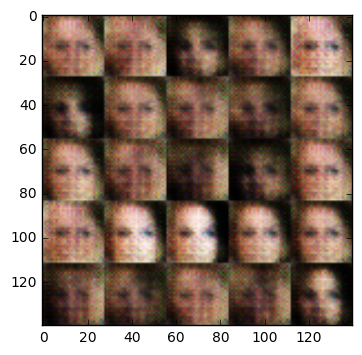

Epoch 1/4... Step 250... Discriminator Loss: 1.7167... Generator Loss: 0.4859
Epoch 1/4... Step 300... Discriminator Loss: 1.6047... Generator Loss: 0.5464
Epoch 1/4... Step 350... Discriminator Loss: 1.5388... Generator Loss: 0.5907
Epoch 1/4... Step 400... Discriminator Loss: 1.5801... Generator Loss: 0.5178
Epoch 1/4... Step 450... Discriminator Loss: 1.5417... Generator Loss: 0.5186


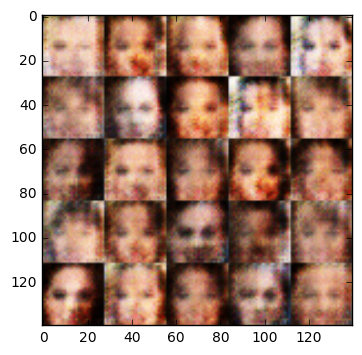

Epoch 1/4... Step 500... Discriminator Loss: 1.5952... Generator Loss: 0.4932
Epoch 1/4... Step 550... Discriminator Loss: 1.6412... Generator Loss: 0.4778
Epoch 1/4... Step 600... Discriminator Loss: 1.6439... Generator Loss: 0.4871
Epoch 1/4... Step 650... Discriminator Loss: 1.6432... Generator Loss: 0.4786
Epoch 1/4... Step 700... Discriminator Loss: 1.5856... Generator Loss: 0.4871


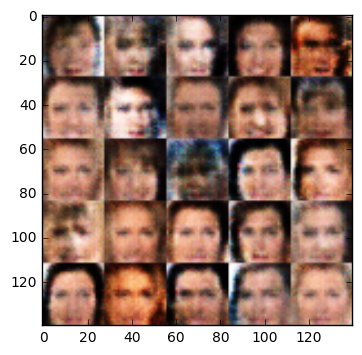

Epoch 1/4... Step 750... Discriminator Loss: 1.5550... Generator Loss: 0.5564
Epoch 1/4... Step 800... Discriminator Loss: 1.6039... Generator Loss: 0.4530
Epoch 1/4... Step 850... Discriminator Loss: 1.5582... Generator Loss: 0.5110
Epoch 1/4... Step 900... Discriminator Loss: 1.5700... Generator Loss: 0.4941
Epoch 1/4... Step 950... Discriminator Loss: 1.5862... Generator Loss: 0.4872


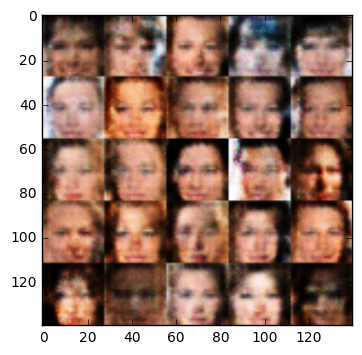

Epoch 1/4... Step 1000... Discriminator Loss: 1.5730... Generator Loss: 0.5041
Epoch 1/4... Step 1050... Discriminator Loss: 1.5550... Generator Loss: 0.4872
Epoch 1/4... Step 1100... Discriminator Loss: 1.5337... Generator Loss: 0.5076
Epoch 1/4... Step 1150... Discriminator Loss: 1.5978... Generator Loss: 0.4802
Epoch 1/4... Step 1200... Discriminator Loss: 1.5606... Generator Loss: 0.4902


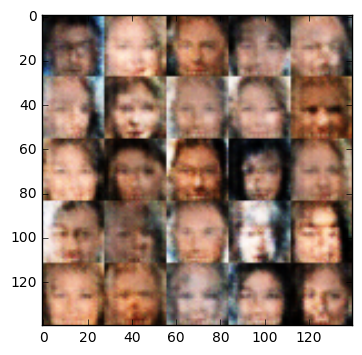

Epoch 1/4... Step 1250... Discriminator Loss: 1.5640... Generator Loss: 0.5013
Epoch 1/4... Step 1300... Discriminator Loss: 1.5790... Generator Loss: 0.4879
Epoch 1/4... Step 1350... Discriminator Loss: 1.5324... Generator Loss: 0.5121
Epoch 1/4... Step 1400... Discriminator Loss: 1.5692... Generator Loss: 0.5079
Epoch 1/4... Step 1450... Discriminator Loss: 1.5551... Generator Loss: 0.4801


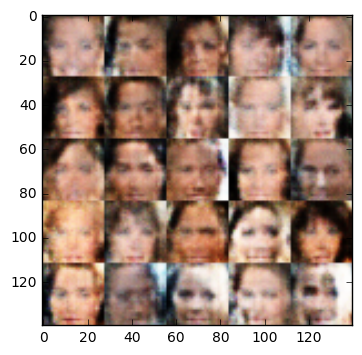

Epoch 1/4... Step 1500... Discriminator Loss: 1.5541... Generator Loss: 0.4776
Epoch 1/4... Step 1550... Discriminator Loss: 1.5484... Generator Loss: 0.5094
Epoch 1/4... Step 1600... Discriminator Loss: 1.5796... Generator Loss: 0.4810
Epoch 1/4... Step 1650... Discriminator Loss: 1.5419... Generator Loss: 0.5068
Epoch 1/4... Step 1700... Discriminator Loss: 1.5408... Generator Loss: 0.5070


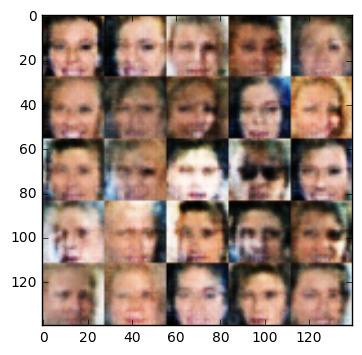

Epoch 1/4... Step 1750... Discriminator Loss: 1.5572... Generator Loss: 0.5012
Epoch 1/4... Step 1800... Discriminator Loss: 1.5572... Generator Loss: 0.4746
Epoch 1/4... Step 1850... Discriminator Loss: 1.5524... Generator Loss: 0.4950
Epoch 1/4... Step 1900... Discriminator Loss: 1.5328... Generator Loss: 0.5214
Epoch 1/4... Step 1950... Discriminator Loss: 1.5527... Generator Loss: 0.4960


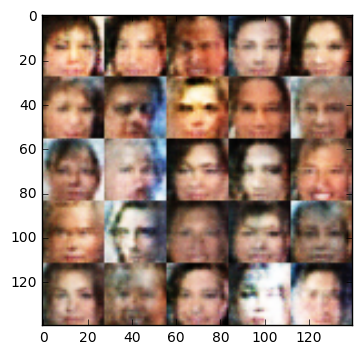

Epoch 1/4... Step 2000... Discriminator Loss: 1.5255... Generator Loss: 0.5319
Epoch 1/4... Step 2050... Discriminator Loss: 1.5473... Generator Loss: 0.5148
Epoch 1/4... Step 2100... Discriminator Loss: 1.5493... Generator Loss: 0.4890
Epoch 1/4... Step 2150... Discriminator Loss: 1.5690... Generator Loss: 0.5018
Epoch 1/4... Step 2200... Discriminator Loss: 1.5569... Generator Loss: 0.5236


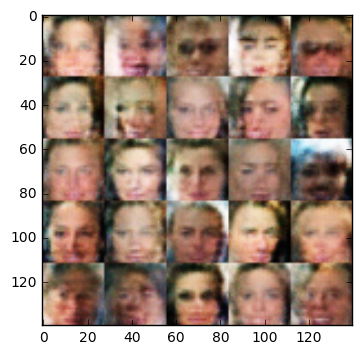

Epoch 1/4... Step 2250... Discriminator Loss: 1.5503... Generator Loss: 0.4962
Epoch 1/4... Step 2300... Discriminator Loss: 1.5437... Generator Loss: 0.5063
Epoch 1/4... Step 2350... Discriminator Loss: 1.5511... Generator Loss: 0.4918
Epoch 1/4... Step 2400... Discriminator Loss: 1.5591... Generator Loss: 0.4904
Epoch 1/4... Step 2450... Discriminator Loss: 1.5423... Generator Loss: 0.5214


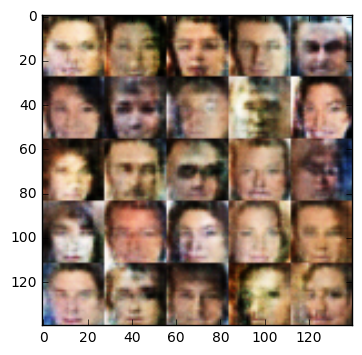

Epoch 1/4... Step 2500... Discriminator Loss: 1.5555... Generator Loss: 0.5067
Epoch 1/4... Step 2550... Discriminator Loss: 1.5466... Generator Loss: 0.4990
Epoch 1/4... Step 2600... Discriminator Loss: 1.5669... Generator Loss: 0.5283
Epoch 1/4... Step 2650... Discriminator Loss: 1.5477... Generator Loss: 0.4869
Epoch 1/4... Step 2700... Discriminator Loss: 1.5628... Generator Loss: 0.4897


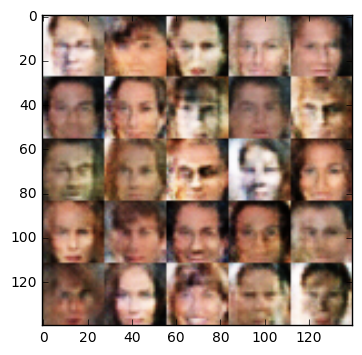

Epoch 1/4... Step 2750... Discriminator Loss: 1.5387... Generator Loss: 0.5178
Epoch 1/4... Step 2800... Discriminator Loss: 1.5468... Generator Loss: 0.5040
Epoch 1/4... Step 2850... Discriminator Loss: 1.5445... Generator Loss: 0.5062
Epoch 1/4... Step 2900... Discriminator Loss: 1.5553... Generator Loss: 0.4938
Epoch 1/4... Step 2950... Discriminator Loss: 1.5417... Generator Loss: 0.5284


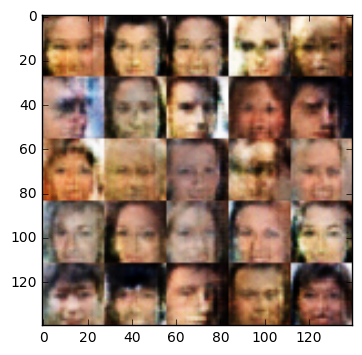

Epoch 1/4... Step 3000... Discriminator Loss: 1.5510... Generator Loss: 0.5149
Epoch 1/4... Step 3050... Discriminator Loss: 1.5421... Generator Loss: 0.5293
Epoch 1/4... Step 3100... Discriminator Loss: 1.5476... Generator Loss: 0.4910
Epoch 1/4... Step 3150... Discriminator Loss: 1.5289... Generator Loss: 0.4988
Epoch 2/4... Step 50... Discriminator Loss: 1.5567... Generator Loss: 0.5136
Epoch 2/4... Step 100... Discriminator Loss: 1.5599... Generator Loss: 0.5030
Epoch 2/4... Step 150... Discriminator Loss: 1.5608... Generator Loss: 0.4853
Epoch 2/4... Step 200... Discriminator Loss: 1.5546... Generator Loss: 0.4901


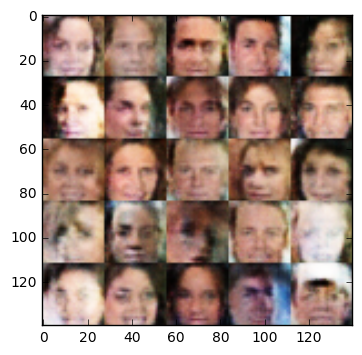

Epoch 2/4... Step 250... Discriminator Loss: 1.5535... Generator Loss: 0.4968
Epoch 2/4... Step 300... Discriminator Loss: 1.5432... Generator Loss: 0.5216
Epoch 2/4... Step 350... Discriminator Loss: 1.5274... Generator Loss: 0.5499
Epoch 2/4... Step 400... Discriminator Loss: 1.5539... Generator Loss: 0.5138
Epoch 2/4... Step 450... Discriminator Loss: 1.5566... Generator Loss: 0.5112


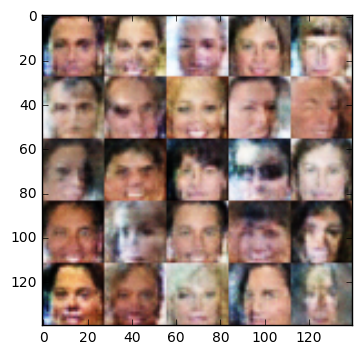

Epoch 2/4... Step 500... Discriminator Loss: 1.5320... Generator Loss: 0.5171
Epoch 2/4... Step 550... Discriminator Loss: 1.5401... Generator Loss: 0.5143
Epoch 2/4... Step 600... Discriminator Loss: 1.5336... Generator Loss: 0.5143
Epoch 2/4... Step 650... Discriminator Loss: 1.5464... Generator Loss: 0.5054
Epoch 2/4... Step 700... Discriminator Loss: 1.5577... Generator Loss: 0.5078


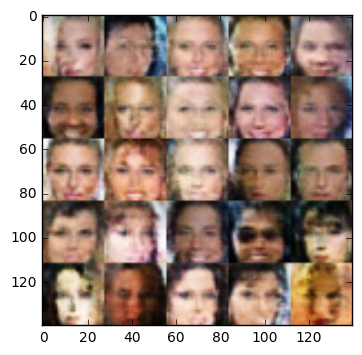

Epoch 2/4... Step 750... Discriminator Loss: 1.5347... Generator Loss: 0.5153
Epoch 2/4... Step 800... Discriminator Loss: 1.5473... Generator Loss: 0.5138
Epoch 2/4... Step 850... Discriminator Loss: 1.5294... Generator Loss: 0.5292
Epoch 2/4... Step 900... Discriminator Loss: 1.5393... Generator Loss: 0.5108
Epoch 2/4... Step 950... Discriminator Loss: 1.5375... Generator Loss: 0.5030


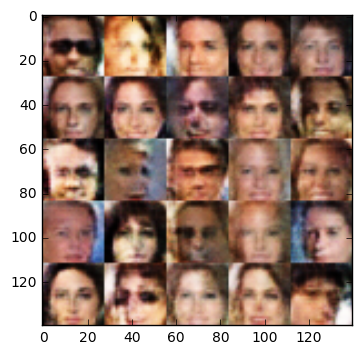

Epoch 2/4... Step 1000... Discriminator Loss: 1.5443... Generator Loss: 0.5108
Epoch 2/4... Step 1050... Discriminator Loss: 1.5315... Generator Loss: 0.5150
Epoch 2/4... Step 1100... Discriminator Loss: 1.5463... Generator Loss: 0.5012
Epoch 2/4... Step 1150... Discriminator Loss: 1.5524... Generator Loss: 0.5066
Epoch 2/4... Step 1200... Discriminator Loss: 1.5273... Generator Loss: 0.5151


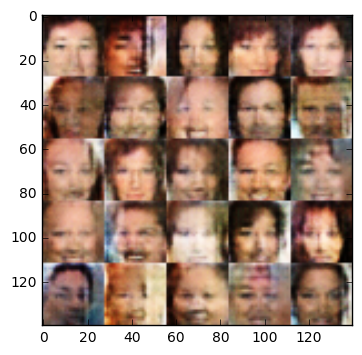

Epoch 2/4... Step 1250... Discriminator Loss: 1.5274... Generator Loss: 0.5350
Epoch 2/4... Step 1300... Discriminator Loss: 1.5417... Generator Loss: 0.5119
Epoch 2/4... Step 1350... Discriminator Loss: 1.5213... Generator Loss: 0.5153
Epoch 2/4... Step 1400... Discriminator Loss: 1.5415... Generator Loss: 0.5149
Epoch 2/4... Step 1450... Discriminator Loss: 1.5443... Generator Loss: 0.4991


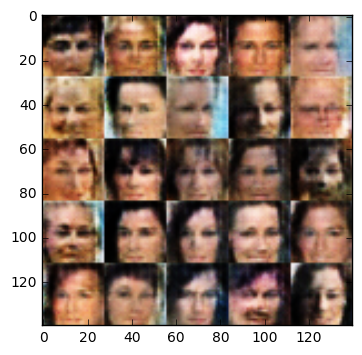

Epoch 2/4... Step 1500... Discriminator Loss: 1.5569... Generator Loss: 0.4957
Epoch 2/4... Step 1550... Discriminator Loss: 1.5369... Generator Loss: 0.5261
Epoch 2/4... Step 1600... Discriminator Loss: 1.5392... Generator Loss: 0.5030
Epoch 2/4... Step 1650... Discriminator Loss: 1.5367... Generator Loss: 0.5239
Epoch 2/4... Step 1700... Discriminator Loss: 1.5343... Generator Loss: 0.4999


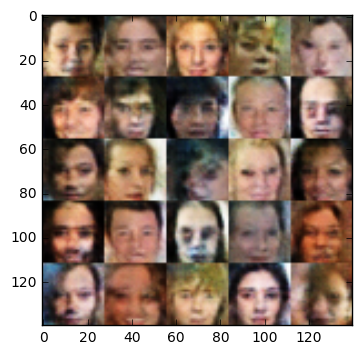

Epoch 2/4... Step 1750... Discriminator Loss: 1.5377... Generator Loss: 0.4924
Epoch 2/4... Step 1800... Discriminator Loss: 1.5360... Generator Loss: 0.5011
Epoch 2/4... Step 1850... Discriminator Loss: 1.5348... Generator Loss: 0.5063
Epoch 2/4... Step 1900... Discriminator Loss: 1.5344... Generator Loss: 0.5189
Epoch 2/4... Step 1950... Discriminator Loss: 1.5387... Generator Loss: 0.5050


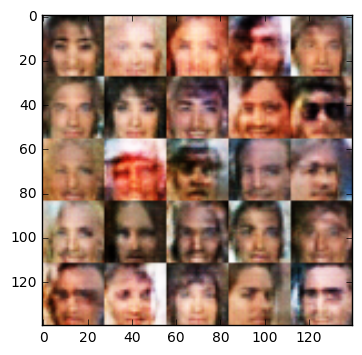

Epoch 2/4... Step 2000... Discriminator Loss: 1.5351... Generator Loss: 0.5041
Epoch 2/4... Step 2050... Discriminator Loss: 1.5233... Generator Loss: 0.5491
Epoch 2/4... Step 2100... Discriminator Loss: 1.5369... Generator Loss: 0.5074
Epoch 2/4... Step 2150... Discriminator Loss: 1.5468... Generator Loss: 0.5319
Epoch 2/4... Step 2200... Discriminator Loss: 1.5345... Generator Loss: 0.5218


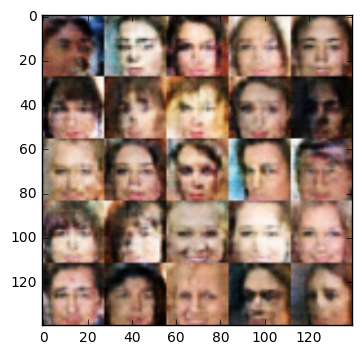

Epoch 2/4... Step 2250... Discriminator Loss: 1.5301... Generator Loss: 0.5225
Epoch 2/4... Step 2300... Discriminator Loss: 1.5362... Generator Loss: 0.5286
Epoch 2/4... Step 2350... Discriminator Loss: 1.5373... Generator Loss: 0.5106
Epoch 2/4... Step 2400... Discriminator Loss: 1.5496... Generator Loss: 0.5050
Epoch 2/4... Step 2450... Discriminator Loss: 1.5294... Generator Loss: 0.5270


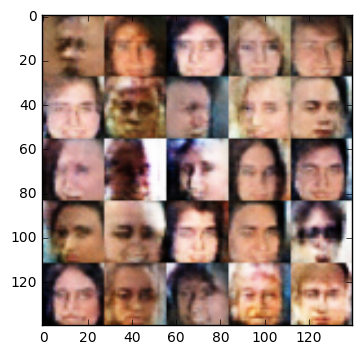

Epoch 2/4... Step 2500... Discriminator Loss: 1.5257... Generator Loss: 0.5147
Epoch 2/4... Step 2550... Discriminator Loss: 1.5293... Generator Loss: 0.5242
Epoch 2/4... Step 2600... Discriminator Loss: 1.5262... Generator Loss: 0.5293
Epoch 2/4... Step 2650... Discriminator Loss: 1.5539... Generator Loss: 0.4808
Epoch 2/4... Step 2700... Discriminator Loss: 1.5408... Generator Loss: 0.5076


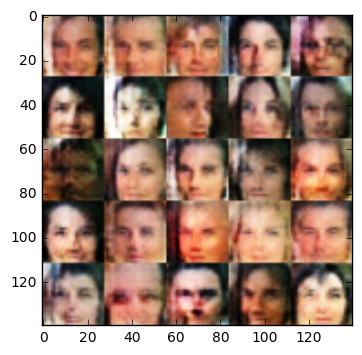

Epoch 2/4... Step 2750... Discriminator Loss: 1.5262... Generator Loss: 0.5294
Epoch 2/4... Step 2800... Discriminator Loss: 1.5307... Generator Loss: 0.5112
Epoch 2/4... Step 2850... Discriminator Loss: 1.5310... Generator Loss: 0.5253
Epoch 2/4... Step 2900... Discriminator Loss: 1.5392... Generator Loss: 0.5002
Epoch 2/4... Step 2950... Discriminator Loss: 1.5279... Generator Loss: 0.5405


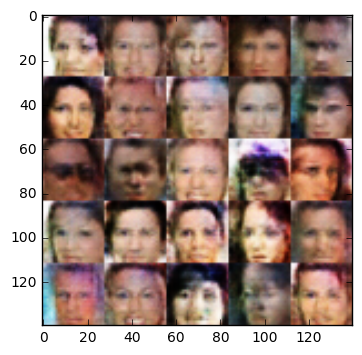

Epoch 2/4... Step 3000... Discriminator Loss: 1.5324... Generator Loss: 0.5091
Epoch 2/4... Step 3050... Discriminator Loss: 1.5194... Generator Loss: 0.5320
Epoch 2/4... Step 3100... Discriminator Loss: 1.5315... Generator Loss: 0.5042
Epoch 2/4... Step 3150... Discriminator Loss: 1.5271... Generator Loss: 0.5266
Epoch 3/4... Step 50... Discriminator Loss: 1.5295... Generator Loss: 0.5274
Epoch 3/4... Step 100... Discriminator Loss: 1.5348... Generator Loss: 0.5139
Epoch 3/4... Step 150... Discriminator Loss: 1.5411... Generator Loss: 0.4922
Epoch 3/4... Step 200... Discriminator Loss: 1.5351... Generator Loss: 0.5202


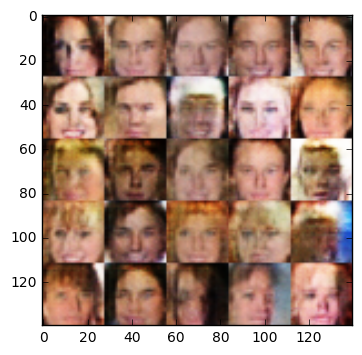

Epoch 3/4... Step 250... Discriminator Loss: 1.5294... Generator Loss: 0.5119
Epoch 3/4... Step 300... Discriminator Loss: 1.5249... Generator Loss: 0.5206
Epoch 3/4... Step 350... Discriminator Loss: 1.5473... Generator Loss: 0.5474
Epoch 3/4... Step 400... Discriminator Loss: 1.5244... Generator Loss: 0.5114
Epoch 3/4... Step 450... Discriminator Loss: 1.5231... Generator Loss: 0.5138


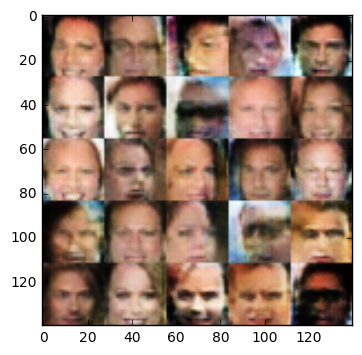

Epoch 3/4... Step 500... Discriminator Loss: 1.5305... Generator Loss: 0.5156
Epoch 3/4... Step 550... Discriminator Loss: 1.5295... Generator Loss: 0.5188
Epoch 3/4... Step 600... Discriminator Loss: 1.5374... Generator Loss: 0.5018
Epoch 3/4... Step 650... Discriminator Loss: 1.5334... Generator Loss: 0.4965
Epoch 3/4... Step 700... Discriminator Loss: 1.5271... Generator Loss: 0.5244


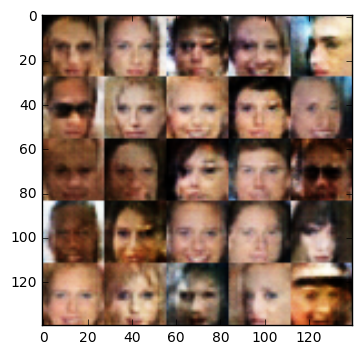

Epoch 3/4... Step 750... Discriminator Loss: 1.5339... Generator Loss: 0.5112
Epoch 3/4... Step 800... Discriminator Loss: 1.5320... Generator Loss: 0.5164
Epoch 3/4... Step 850... Discriminator Loss: 1.5274... Generator Loss: 0.5369
Epoch 3/4... Step 900... Discriminator Loss: 1.5247... Generator Loss: 0.5203
Epoch 3/4... Step 950... Discriminator Loss: 1.5259... Generator Loss: 0.5232


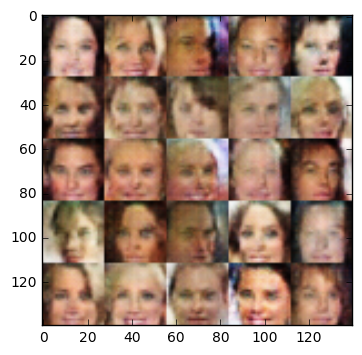

Epoch 3/4... Step 1000... Discriminator Loss: 1.5288... Generator Loss: 0.5069
Epoch 3/4... Step 1050... Discriminator Loss: 1.5293... Generator Loss: 0.5262
Epoch 3/4... Step 1100... Discriminator Loss: 1.5463... Generator Loss: 0.5029
Epoch 3/4... Step 1150... Discriminator Loss: 1.5393... Generator Loss: 0.5132
Epoch 3/4... Step 1200... Discriminator Loss: 1.5249... Generator Loss: 0.5283


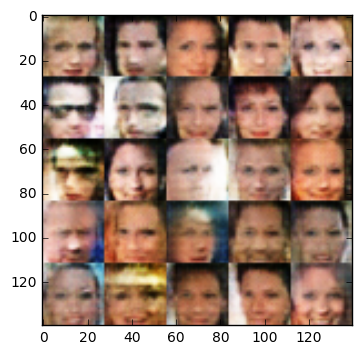

Epoch 3/4... Step 1250... Discriminator Loss: 1.5213... Generator Loss: 0.5175
Epoch 3/4... Step 1300... Discriminator Loss: 1.5411... Generator Loss: 0.5073
Epoch 3/4... Step 1350... Discriminator Loss: 1.5213... Generator Loss: 0.5164
Epoch 3/4... Step 1400... Discriminator Loss: 1.5288... Generator Loss: 0.5198
Epoch 3/4... Step 1450... Discriminator Loss: 1.5218... Generator Loss: 0.5148


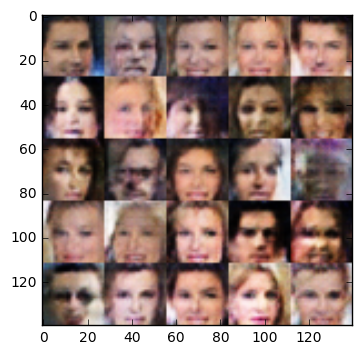

Epoch 3/4... Step 1500... Discriminator Loss: 1.5231... Generator Loss: 0.5215
Epoch 3/4... Step 1550... Discriminator Loss: 1.5255... Generator Loss: 0.5172
Epoch 3/4... Step 1600... Discriminator Loss: 1.5345... Generator Loss: 0.5238
Epoch 3/4... Step 1650... Discriminator Loss: 1.5269... Generator Loss: 0.5063
Epoch 3/4... Step 1700... Discriminator Loss: 1.5221... Generator Loss: 0.5249


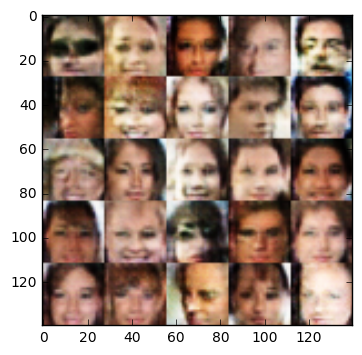

Epoch 3/4... Step 1750... Discriminator Loss: 1.5296... Generator Loss: 0.5005
Epoch 3/4... Step 1800... Discriminator Loss: 1.5210... Generator Loss: 0.5268
Epoch 3/4... Step 1850... Discriminator Loss: 1.5334... Generator Loss: 0.5053
Epoch 3/4... Step 1900... Discriminator Loss: 1.5297... Generator Loss: 0.5230
Epoch 3/4... Step 1950... Discriminator Loss: 1.5328... Generator Loss: 0.5168


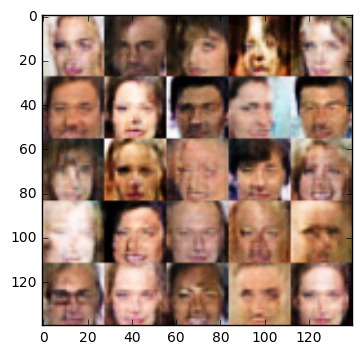

Epoch 3/4... Step 2000... Discriminator Loss: 1.5250... Generator Loss: 0.5161
Epoch 3/4... Step 2050... Discriminator Loss: 1.5307... Generator Loss: 0.5030
Epoch 3/4... Step 2100... Discriminator Loss: 1.5372... Generator Loss: 0.5024
Epoch 3/4... Step 2150... Discriminator Loss: 1.5178... Generator Loss: 0.5418
Epoch 3/4... Step 2200... Discriminator Loss: 1.5420... Generator Loss: 0.5387


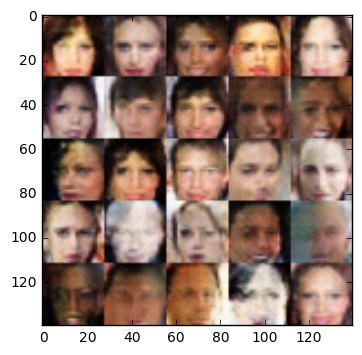

Epoch 3/4... Step 2250... Discriminator Loss: 1.5293... Generator Loss: 0.5198
Epoch 3/4... Step 2300... Discriminator Loss: 1.5207... Generator Loss: 0.5468
Epoch 3/4... Step 2350... Discriminator Loss: 1.5250... Generator Loss: 0.5151
Epoch 3/4... Step 2400... Discriminator Loss: 1.5322... Generator Loss: 0.5179
Epoch 3/4... Step 2450... Discriminator Loss: 1.5282... Generator Loss: 0.5133


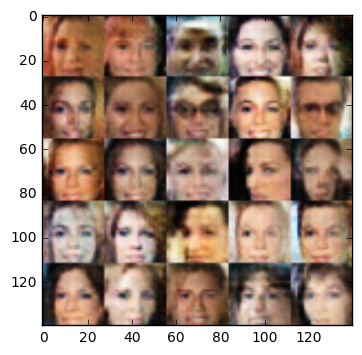

Epoch 3/4... Step 2500... Discriminator Loss: 1.5371... Generator Loss: 0.4993
Epoch 3/4... Step 2550... Discriminator Loss: 1.5255... Generator Loss: 0.5290
Epoch 3/4... Step 2600... Discriminator Loss: 1.5288... Generator Loss: 0.5171
Epoch 3/4... Step 2650... Discriminator Loss: 1.5254... Generator Loss: 0.4875
Epoch 3/4... Step 2700... Discriminator Loss: 1.5325... Generator Loss: 0.5075


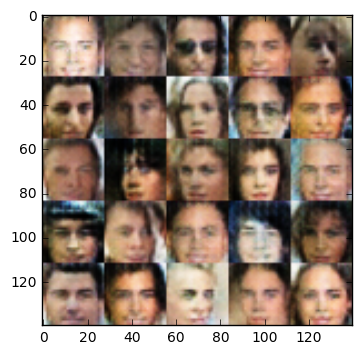

Epoch 3/4... Step 2750... Discriminator Loss: 1.5226... Generator Loss: 0.5186
Epoch 3/4... Step 2800... Discriminator Loss: 1.5319... Generator Loss: 0.4903
Epoch 3/4... Step 2850... Discriminator Loss: 1.5188... Generator Loss: 0.5063
Epoch 3/4... Step 2900... Discriminator Loss: 1.5334... Generator Loss: 0.5194
Epoch 3/4... Step 2950... Discriminator Loss: 1.5225... Generator Loss: 0.5229


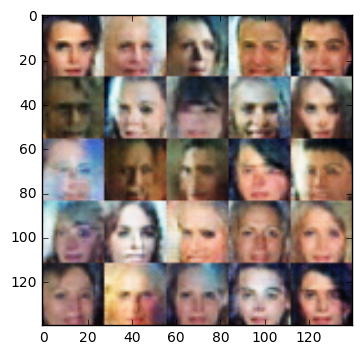

Epoch 3/4... Step 3000... Discriminator Loss: 1.5302... Generator Loss: 0.5137
Epoch 3/4... Step 3050... Discriminator Loss: 1.5296... Generator Loss: 0.5395
Epoch 3/4... Step 3100... Discriminator Loss: 1.5294... Generator Loss: 0.5106
Epoch 3/4... Step 3150... Discriminator Loss: 1.5322... Generator Loss: 0.4988
Epoch 4/4... Step 50... Discriminator Loss: 1.5235... Generator Loss: 0.5511
Epoch 4/4... Step 100... Discriminator Loss: 1.5236... Generator Loss: 0.5002
Epoch 4/4... Step 150... Discriminator Loss: 1.5292... Generator Loss: 0.5033
Epoch 4/4... Step 200... Discriminator Loss: 1.5231... Generator Loss: 0.5230


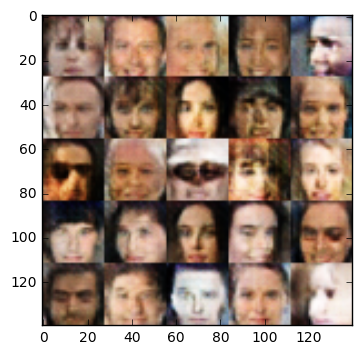

Epoch 4/4... Step 250... Discriminator Loss: 1.5162... Generator Loss: 0.5180
Epoch 4/4... Step 300... Discriminator Loss: 1.5328... Generator Loss: 0.5229
Epoch 4/4... Step 350... Discriminator Loss: 1.5348... Generator Loss: 0.5312
Epoch 4/4... Step 400... Discriminator Loss: 1.5234... Generator Loss: 0.5003
Epoch 4/4... Step 450... Discriminator Loss: 1.5276... Generator Loss: 0.5028


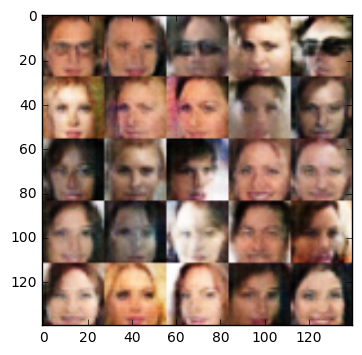

Epoch 4/4... Step 500... Discriminator Loss: 1.5262... Generator Loss: 0.5047
Epoch 4/4... Step 550... Discriminator Loss: 1.5269... Generator Loss: 0.5126
Epoch 4/4... Step 600... Discriminator Loss: 1.5362... Generator Loss: 0.5080
Epoch 4/4... Step 650... Discriminator Loss: 1.5220... Generator Loss: 0.5134
Epoch 4/4... Step 700... Discriminator Loss: 1.5417... Generator Loss: 0.5413


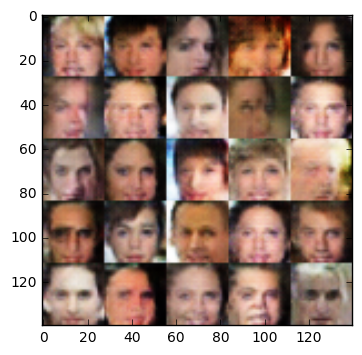

Epoch 4/4... Step 750... Discriminator Loss: 1.5276... Generator Loss: 0.5242
Epoch 4/4... Step 800... Discriminator Loss: 1.5284... Generator Loss: 0.5115
Epoch 4/4... Step 850... Discriminator Loss: 1.5264... Generator Loss: 0.5300
Epoch 4/4... Step 900... Discriminator Loss: 1.5282... Generator Loss: 0.5041
Epoch 4/4... Step 950... Discriminator Loss: 1.5186... Generator Loss: 0.5022


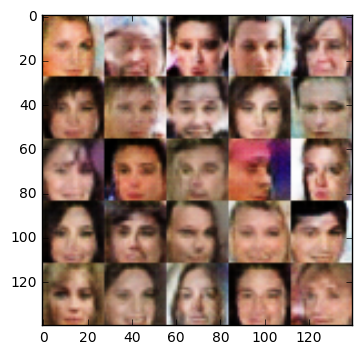

Epoch 4/4... Step 1000... Discriminator Loss: 1.5228... Generator Loss: 0.5030
Epoch 4/4... Step 1050... Discriminator Loss: 1.5191... Generator Loss: 0.5379
Epoch 4/4... Step 1100... Discriminator Loss: 1.5422... Generator Loss: 0.5103
Epoch 4/4... Step 1150... Discriminator Loss: 1.5262... Generator Loss: 0.5086


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = .0002
beta1 = 0.4

epochs = 4

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.